In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import matplotlib as plt
import scvelo as scv
import cellrank as cr
import loompy

In [2]:
sc.set_figure_params(facecolor="white", figsize=(15, 15))
sc.settings.verbosity = 3

In [3]:
adata_loom_NP3 = scv.read('NP3/NP3.loom', cache=True)
adata_loom_NP3.var_names_make_unique()
adata = sc.read_10x_mtx('./NP3', gex_only = False,cache=True)
adata.var_names_make_unique()

... reading from cache file cache/NP3-NP3.h5ad
... reading from cache file cache/NP3-matrix.h5ad


/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata = scv.utils.merge(adata, adata_loom_NP3)

In [5]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)
adata.obs['log10GenesPerUMI'] =  np.log10(adata.obs.n_genes_by_counts) / np.log10(adata.obs.total_counts)
adata = adata[adata.obs.n_genes_by_counts < 9000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]
adata = adata[adata.obs.log10GenesPerUMI > 0.8, :]
adata = adata[adata.obs.total_counts > 500, :]
adata = adata[adata.obs.pct_counts_ribo > 5, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,min_mean=0.0125,max_mean=3,min_disp=0.5) # default value (may be to change)
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata,resolution=0.1,key_added='leiden01')

normalizing counts per cell


/usr/local/lib/python3.8/dist-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c


    finished (0:00:21)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden01', the cluster labels (adata.obs, categorical) (0:00:00)


In [6]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


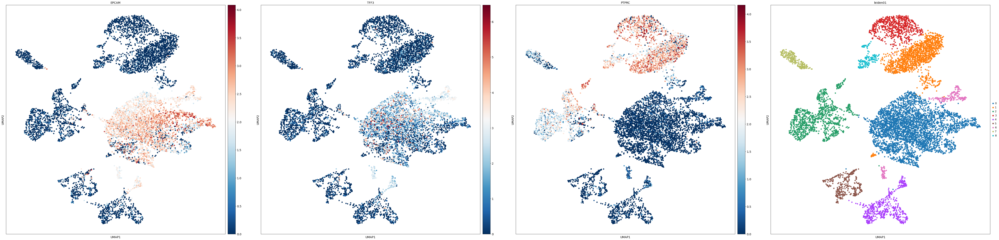

In [7]:
sc.set_figure_params(facecolor="white", figsize=(20, 20))
sc.pl.umap(adata,color=['EPCAM','TFF3','PTPRC','leiden01'],color_map = 'RdBu_r',size=150)

In [8]:
adata_subset = adata[adata.obs['leiden01'].isin(['0'])]

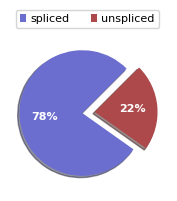

In [9]:
scv.pl.proportions(adata_subset)

In [10]:
scv.pp.filter_and_normalize(adata_subset,subset_highly_variable=False)

Normalized count data: spliced, unspliced.


In [11]:
scv.pp.moments(adata_subset)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [12]:
scv.tl.velocity_graph(adata_subset,n_jobs=8)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 8/24 cores)


  0%|          | 0/3905 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/usr/local/lib/python3.8/dist-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


In [13]:
sc.tl.pca(adata_subset, svd_solver='arpack')
sc.pp.neighbors(adata_subset, n_neighbors=10, n_pcs=20)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [14]:
sc.tl.leiden(adata_subset,resolution=0.15,key_added='leiden03')

running Leiden clustering
    finished: found 5 clusters and added
    'leiden03', the cluster labels (adata.obs, categorical) (0:00:00)


In [15]:
sc.tl.umap(adata_subset)
sc.tl.tsne(adata_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:05)


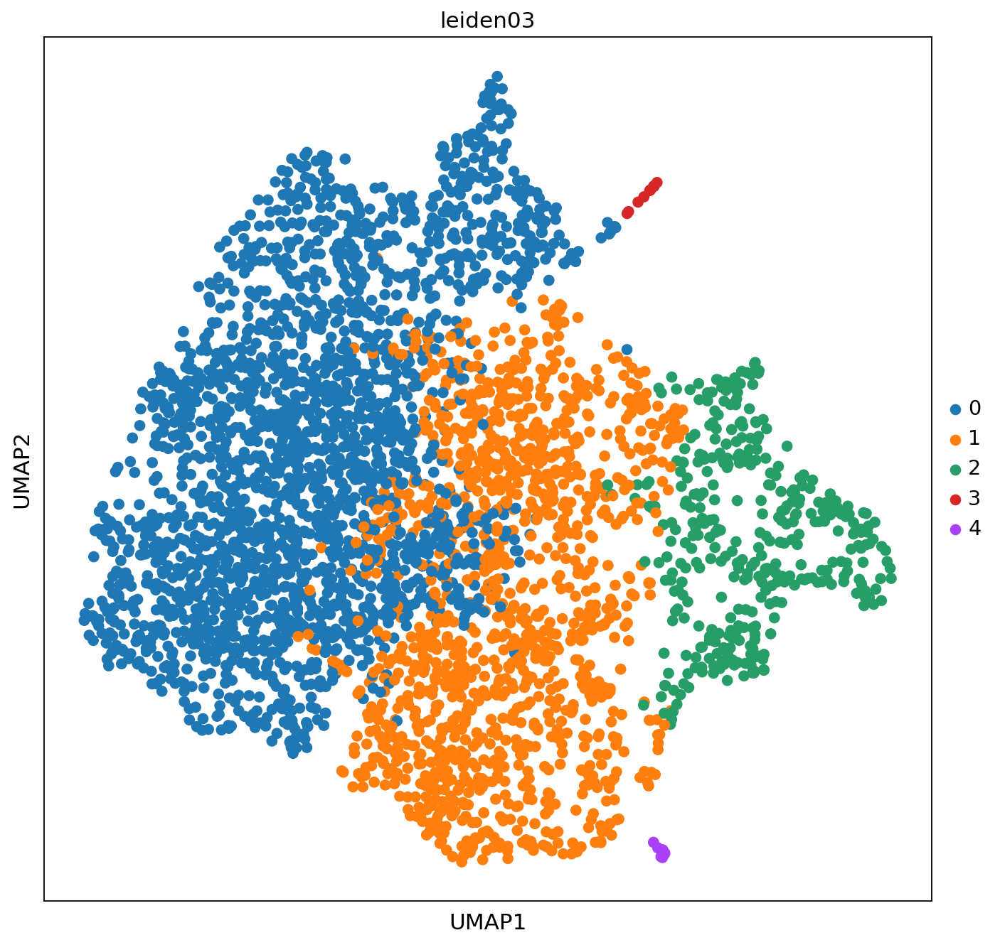

In [16]:
sc.set_figure_params(facecolor="white", figsize=(10, 10))
sc.pl.umap(adata_subset, color=['leiden03'],size=200,save='clustering_NP3.png')

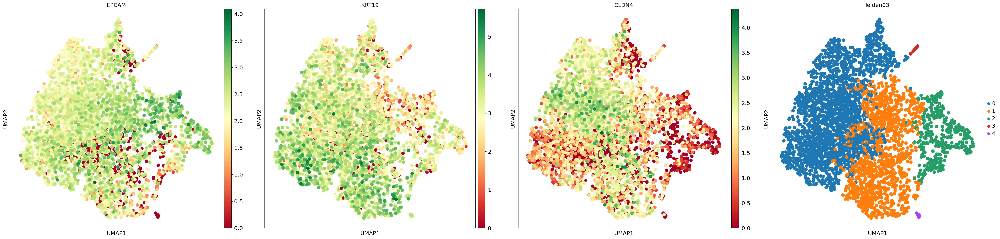

In [33]:
sc.pl.umap(adata_subset,color=['EPCAM','KRT19','CLDN4','leiden03'],color_map = 'RdYlGn',size=300)

In [18]:
scv.tl.velocity_graph(adata_subset)

computing velocity graph (using 1/24 cores)


  0%|          | 0/3905 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/usr/local/lib/python3.8/dist-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_umap_velocity_stream_embedding_NP3.png


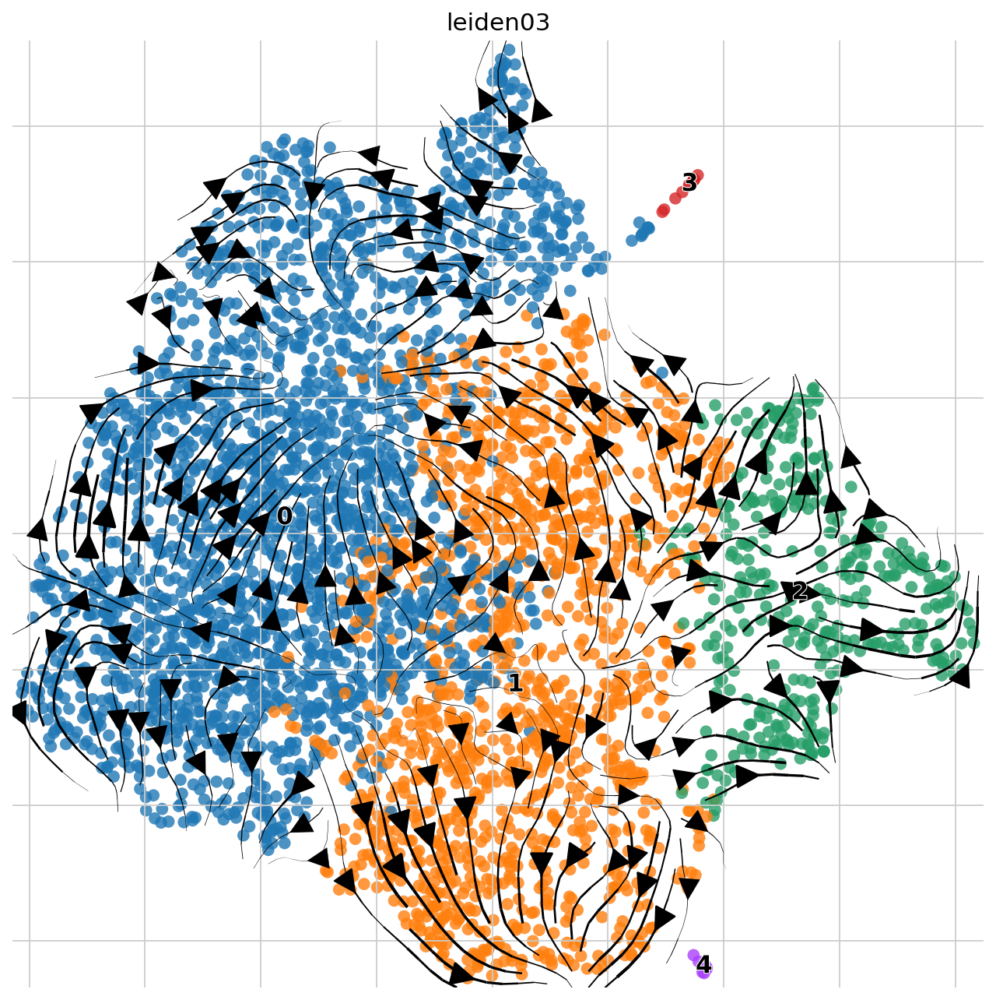

In [19]:
sc.set_figure_params(facecolor="white", figsize=(10, 10))
scv.pl.velocity_embedding_stream(adata_subset, basis='umap',color='leiden03',size=200,alpha=0.8,arrow_size=3,save='umap_velocity_stream_embedding_NP3.png')

In [20]:
scv.tl.rank_velocity_genes(adata_subset,groupby='leiden03',min_corr=0.2)

ranking velocity genes
    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [21]:
df  = scv.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])
pd.set_option('display.max_rows', 200)
df.head(20)

,0,1,2,3,4
0,CPM,CYP3A5,LAMA3,IQGAP3,KIFC3
1,KMO,INPP4B,RUNX2,CENPF,PDE5A
2,RHEX,FAT1,HUNK,LAMA4,ENC1
3,TMEM116,SVIL,NKD1,RTKN2,MOSPD1
4,ITGB8,ANKRD37,FYN,CDCA2,KIF2C
5,RANBP17,MAP2,PCSK6,KRT19,DSG4
6,TNS3,RND3,MAN1A1,NUSAP1,GOLGA7B
7,SGCD,CEMIP2,PRSS23,BLM,KHDRBS3
8,LINC01480,COL23A1,KCNMA1,DYNC2H1,MDM2
9,ADAMTS8,FEM1C,HPS4,CP,SYT1


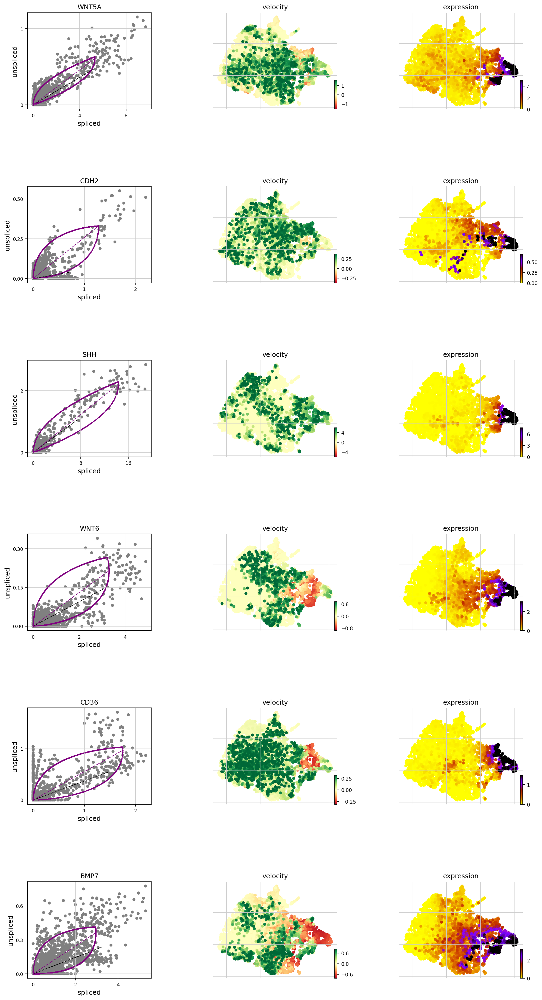

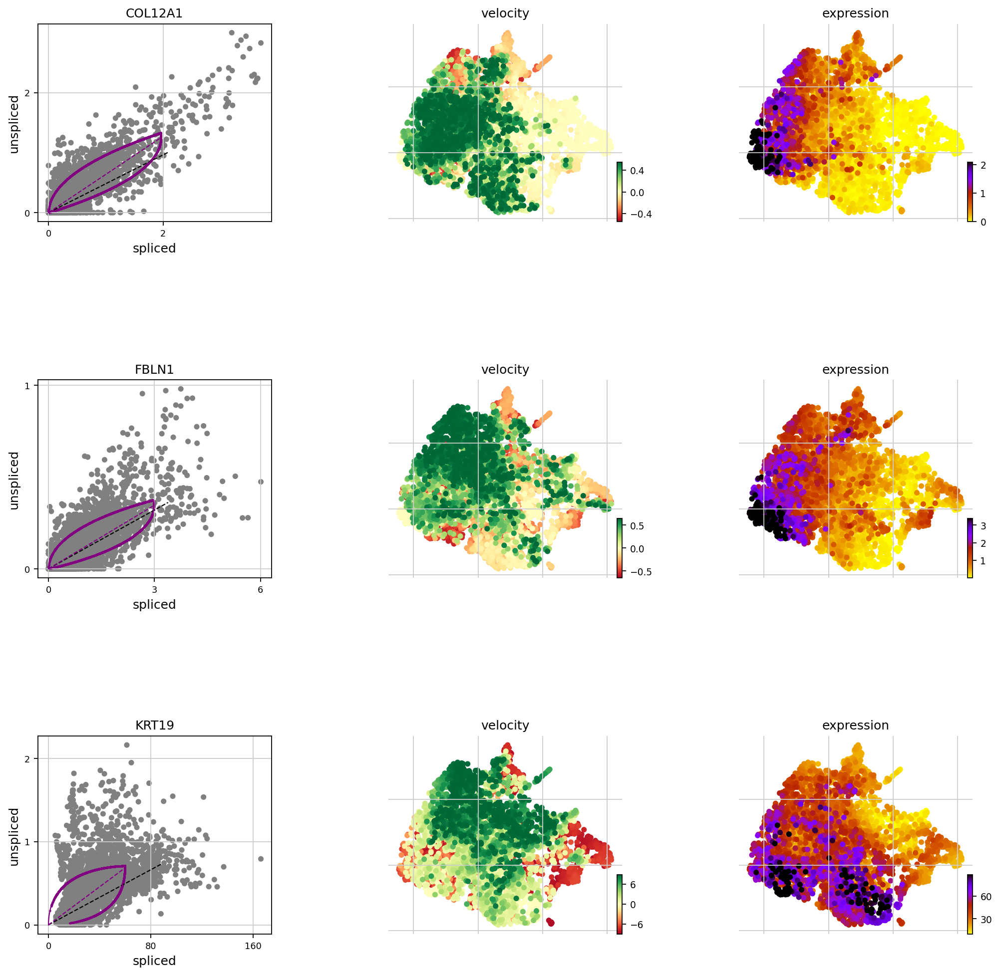

saving figure to file ./figures/scvelo_velocity_NP3.pdf


In [ ]:
scv.pl.velocity(adata_subset, ['WNT5A','CDH2','SHH','WNT6','CD36','BMP7'],size=100,alpha=1)
scv.pl.velocity(adata_subset, ['BCAT1','COL12A1','FBLN1','UNC5B','KRT19'],size=100,alpha=1)
scv.pl.velocity(adata_subset, ['COL23A1','COL5A2','FBLN1','COL1A2','S100P','GALNT3','KRT8','KRT19','ELF3','SLC44A4','PRSS8'],size=100,alpha=1,save='velocity_NP3.pdf')

saving figure to file ./figures/scvelo_TGFB2.pdf


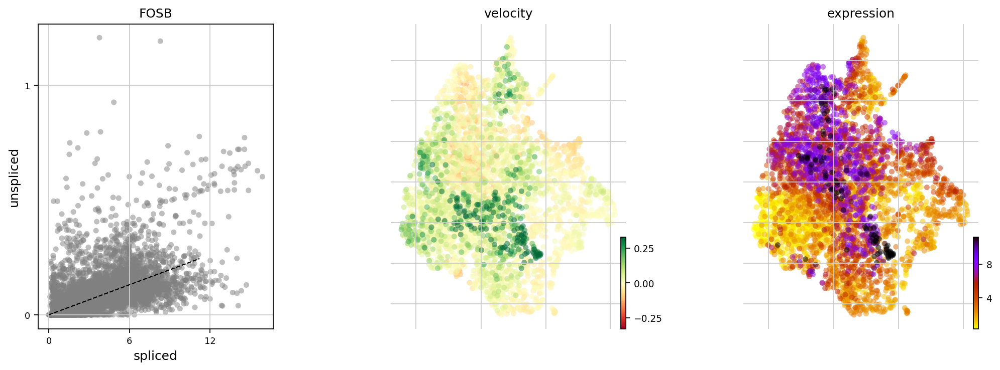

In [23]:
scv.pl.velocity(adata_subset, ['FOSB'],size=100,save='TGFB2')

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
saving figure to file ./figures/scvelo_confidence_NP3_plot.png


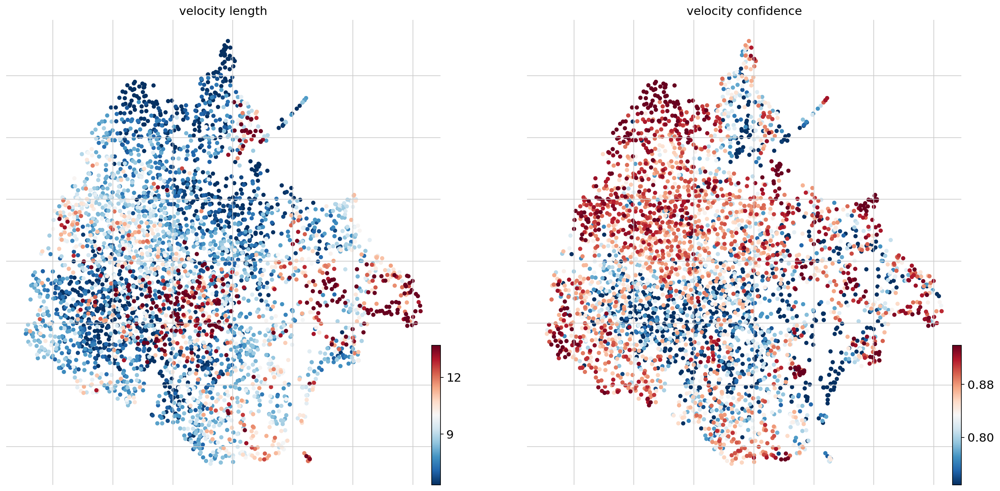

In [24]:
scv.tl.velocity_confidence(adata_subset)
keys = 'velocity_length','velocity_confidence'
scv.pl.scatter(adata_subset,c=keys,perc=[15,95],color_map = 'RdBu_r',size=100,save='confidence_NP3_plot.png')

computing terminal states
    identified 6 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


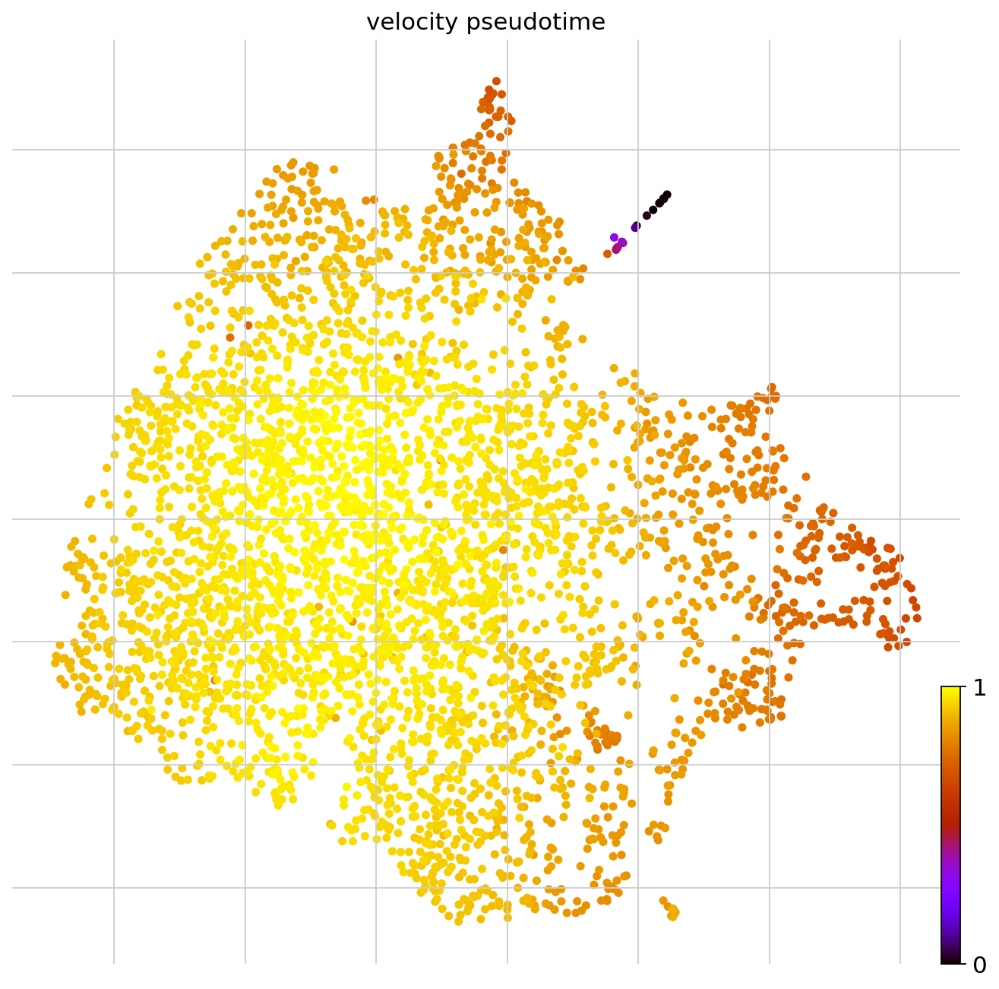

In [25]:
scv.tl.velocity_pseudotime(adata_subset)
scv.pl.scatter(adata_subset,color='velocity_pseudotime',color_map = 'gnuplot',size=100)

In [26]:
scv.tl.recover_dynamics(adata_subset,n_jobs=12)
scv.tl.velocity(adata_subset,mode='dynamical')
scv.tl.velocity_graph(adata_subset)

recovering dynamics (using 12/24 cores)


  0%|          | 0/890 [00:00<?, ?gene/s]

/usr/local/lib/python3.8/dist-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/usr/local/lib/python3.8/dist-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:43) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/24 cores)


  0%|          | 0/3905 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/usr/local/lib/python3.8/dist-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_latent_NP3_plot.png


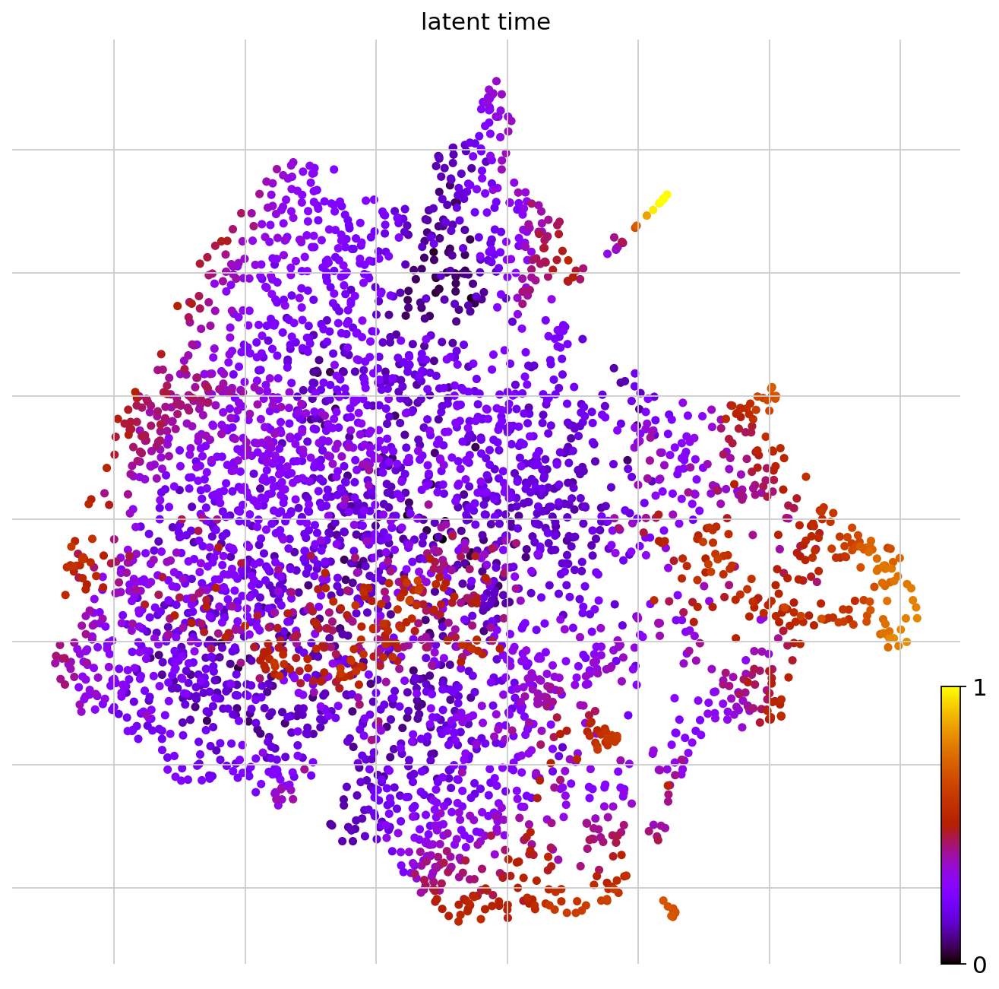

In [27]:
scv.tl.latent_time(adata_subset)
scv.pl.scatter(adata_subset,color= 'latent_time',color_map='gnuplot',size=100,save='latent_NP3_plot.png')

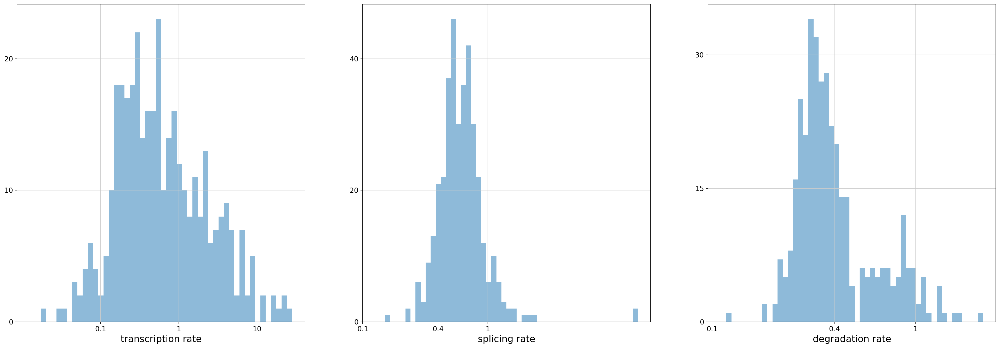

/usr/local/lib/python3.8/dist-packages/scvelo/core/_anndata.py:311: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
MEGF6,0.251944,2.566316,0.356769,4.909199,0.354732,0.028418,0.120166,1.119469e-05,0.0,0.0,4.735314e-01,0.087878,0.467959,2.616694,1.730095,0.166380
DNAJC11,0.079558,1.038759,0.256915,6.690833,0.545757,0.025653,0.056666,1.042409e-14,0.0,0.0,4.941521e-01,0.386354,0.223938,6.415076,2.232866,0.183021
UTS2,0.002052,0.008001,0.186034,10.234025,41.374266,0.066375,0.002094,6.864080e-11,0.0,0.0,2.238733e-16,0.274810,0.008668,0.417263,4.703435,0.201522
AL034417.3,0.043225,2.172239,0.293766,4.648744,0.197853,0.004361,0.025689,9.453484e-02,0.0,0.0,3.943299e-02,0.013637,0.081329,1.011375,2.492849,0.120537
SPSB1,0.185955,0.560049,0.309095,7.202612,1.415078,0.125410,0.128505,2.939679e-01,0.0,0.0,2.926556e-01,0.310551,0.380635,0.632529,1.829623,0.140325


In [28]:
df = adata_subset.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata_subset, 'fit*', dropna=True).head()

In [29]:
top_genes = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index[:300]

saving figure to file ./figures/scvelo_heatmap_heatmap_top_latent_gene_NP3.png


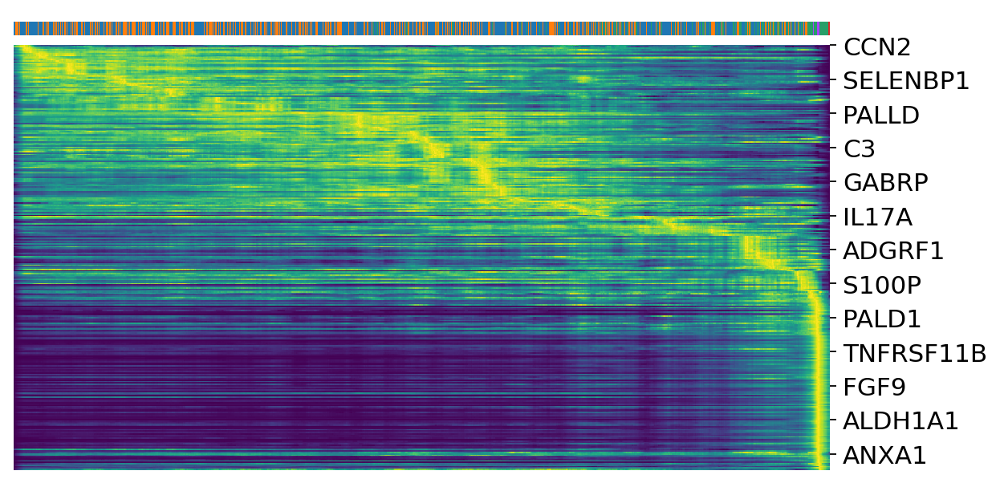

In [30]:
sc.set_figure_params(facecolor="white", figsize=(10, 10))
scv.pl.heatmap(adata_subset, var_names=top_genes, sortby='latent_time', col_color='leiden03', n_convolve=100,save='heatmap_top_latent_gene_NP3.png')

In [31]:
scv.tl.rank_dynamical_genes(adata_subset, groupby='leiden03')
df = scv.get_df(adata_subset, 'rank_dynamical_genes/names')
df.head(10)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,0,1,2,3,4
0,ANXA1,ATF3,RAMP1,DTHD1,CASP14
1,MFHAS1,MAP3K8,FGF19,EGFLAM,AC106876.1
2,NFKB1,SOD2,AC106876.1,CDHR3,SPINK6
3,GCNT2,BAMBI,CHRNA3,ROPN1L,PITX1
4,PDK4,ROBO1,SNCA,C9orf24,PLAUR
5,MAP3K8,APCDD1,ISM1,MIR29B2CHG,S100P
6,KIAA0040,NFKB1,ALDH1A1,FGR,PRDM1
7,KDM6B,ITPKC,NELL2,CTSS,ANXA1
8,SIRT1,PALLD,SMPX,DRAIC,GOLGA7B
9,CD83,CTSS,GJA1,PLCE1,KRT23
